In [1]:
import tensorflow as tf
import PIL
import time

In [2]:
from keras.applications import VGG16
from keras.callbacks import ModelCheckpoint,TensorBoard

Using TensorFlow backend.


In [3]:
vgg_conv = VGG16(weights='imagenet',include_top=False,input_shape=(256, 256, 3))

Instructions for updating:
Colocations handled automatically by placer.


In [4]:
# Freeze the layers except the last 4 layers
for layer in vgg_conv.layers[:-3]:
    layer.trainable = False

In [5]:
# Check the trainable status of the individual layers
for layer in vgg_conv.layers:
    print(layer, layer.trainable)

<keras.engine.input_layer.InputLayer object at 0x0000026DE9BF4CC0> False
<keras.layers.convolutional.Conv2D object at 0x0000026DE9C146A0> False
<keras.layers.convolutional.Conv2D object at 0x0000026DE9C14518> False
<keras.layers.pooling.MaxPooling2D object at 0x0000026DE9C35940> False
<keras.layers.convolutional.Conv2D object at 0x0000026DE9C359B0> False
<keras.layers.convolutional.Conv2D object at 0x0000026DE9C800B8> False
<keras.layers.pooling.MaxPooling2D object at 0x0000026DE9C94E48> False
<keras.layers.convolutional.Conv2D object at 0x0000026DE9C94208> False
<keras.layers.convolutional.Conv2D object at 0x0000026DE9CC64A8> False
<keras.layers.convolutional.Conv2D object at 0x0000026DE9CE4E10> False
<keras.layers.pooling.MaxPooling2D object at 0x0000026DE9D17F60> False
<keras.layers.convolutional.Conv2D object at 0x0000026DE9D17C50> False
<keras.layers.convolutional.Conv2D object at 0x0000026DE9D49AC8> False
<keras.layers.convolutional.Conv2D object at 0x0000026DE9D62C50> False
<ker

In [6]:
from keras import models
from keras import layers
from keras import optimizers
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D,Dropout
# get layers and add average pooling layer

x = vgg_conv.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)

# add output layer
predictions = Dense(38, activation='softmax')(x)

model = Model(inputs=vgg_conv.input, outputs=predictions)
 
# Show a summary of the model. Check the number of trainable parameters
model.summary()

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 256, 256, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
___________________________

In [3]:
from keras.preprocessing.image import ImageDataGenerator

In [10]:
train_datagen = ImageDataGenerator(rescale=1./255,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True)
validation_datagen = ImageDataGenerator(rescale=1./255)

In [4]:
train_batchsize = 32
val_batchsize = 10
img_size=256
train_dir="data/train"
val_dir="data/val"

In [10]:
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(img_size, img_size),
        batch_size=train_batchsize,
        class_mode='categorical',
        color_mode="rgb",
        shuffle=True
)

Found 48855 images belonging to 38 classes.


In [11]:
validation_generator = validation_datagen.flow_from_directory(
        val_dir,
        target_size=(img_size, img_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        color_mode="rgb",
        shuffle=False)

Found 5447 images belonging to 38 classes.


In [18]:
# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-6),
              metrics=['acc'])

In [13]:
checkpoint = ModelCheckpoint("weights/vgg16_best.hdf5",monitor='val_acc',verbose=1,save_best_only=True,mode='max')

In [14]:
name="VGG16-{}".format(int(time.time()))
tensorboard = TensorBoard(log_dir="logs/{}".format(name))

In [19]:
# Train the model
history = model.fit_generator(
      train_generator,
      steps_per_epoch=train_generator.samples/train_generator.batch_size ,
      epochs=15,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      callbacks=[checkpoint,tensorboard],
      verbose=1)
model.save('weights/vgg16.h5')

Epoch 1/15
1527/1526 [==============================] - 1104s 723ms/step - loss: 0.0716 - acc: 0.9785 - val_loss: 0.0838 - val_acc: 0.9798

Epoch 00001: val_acc improved from 0.97301 to 0.97981, saving model to weights/vgg16_best.hdf5
Epoch 2/15
1527/1526 [==============================] - 1034s 677ms/step - loss: 0.0637 - acc: 0.9810 - val_loss: 0.0819 - val_acc: 0.9805

Epoch 00002: val_acc improved from 0.97981 to 0.98054, saving model to weights/vgg16_best.hdf5
Epoch 3/15
1527/1526 [==============================] - 1035s 678ms/step - loss: 0.0600 - acc: 0.9818 - val_loss: 0.0836 - val_acc: 0.9815

Epoch 00003: val_acc improved from 0.98054 to 0.98146, saving model to weights/vgg16_best.hdf5
Epoch 4/15
1527/1526 [==============================] - 1305s 855ms/step - loss: 0.0613 - acc: 0.9820 - val_loss: 0.0826 - val_acc: 0.9816

Epoch 00004: val_acc improved from 0.98146 to 0.98164, saving model to weights/vgg16_best.hdf5
Epoch 5/15
1527/1526 [==============================] - 1040

KeyboardInterrupt: 

In [20]:
# serialize model to JSON
model_json = model.to_json()
with open("weights/VGG16/VGG16_model.json", "w") as json_file:
    json_file.write(model_json)

In [21]:
# Save the model
model.save('weights/vgg16.h5')

## Visualising val_acc and train_acc curves

In [5]:
import matplotlib.pyplot as plt

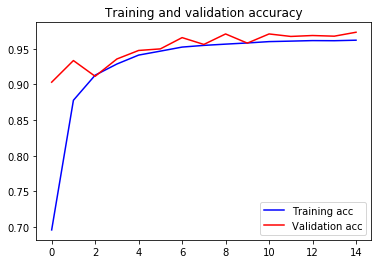

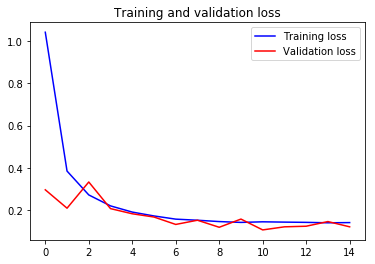

In [23]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

### let us visually see the errors that we got.

In [11]:
# Create a generator for prediction
validation_generator = validation_datagen.flow_from_directory(
        "data/val",
        target_size=(256, 256),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)
 
# Get the filenames from the generator
fnames = validation_generator.filenames
 
# Get the ground truth from generator
ground_truth = validation_generator.classes
 
# Get the label to class mapping from the generator
label2index = validation_generator.class_indices
 
# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())
 
# Get the predictions from the model using the generator
predictions = model.predict_generator(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1) 


Found 5447 images belonging to 38 classes.
545/544 [==============================] - 162s 297ms/step


In [12]:
import numpy as np
import PIL 
from keras.preprocessing import image

No of errors = 91/5447


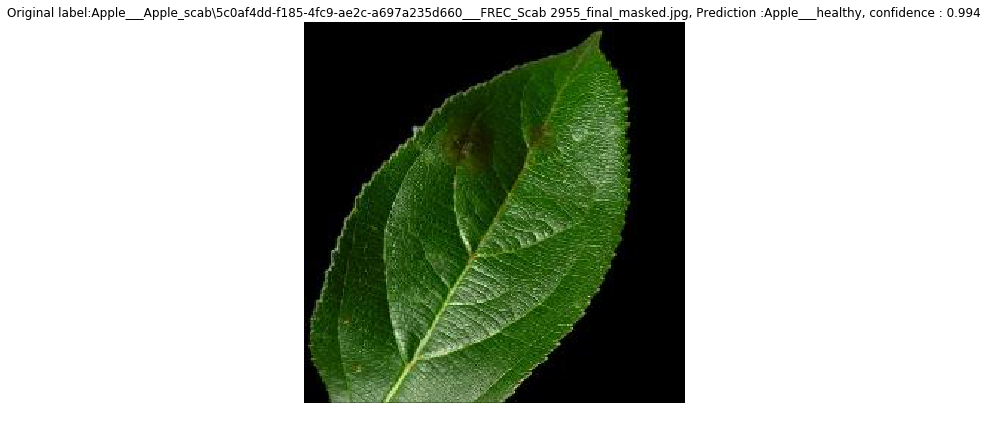

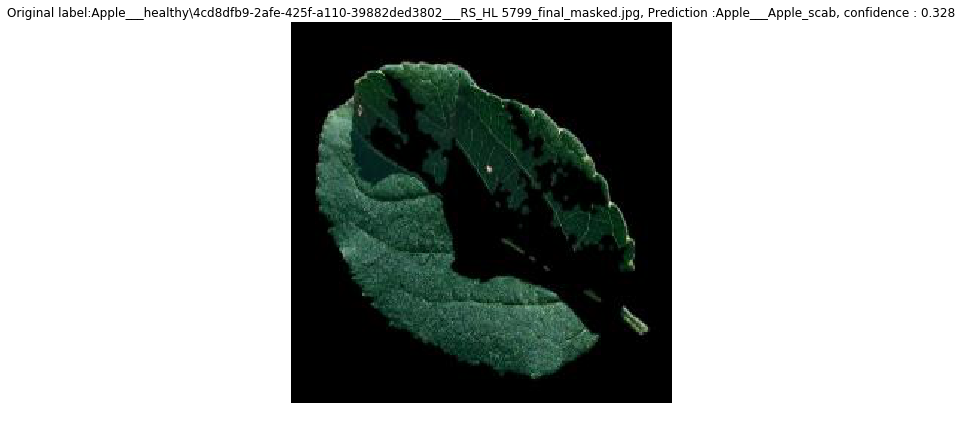

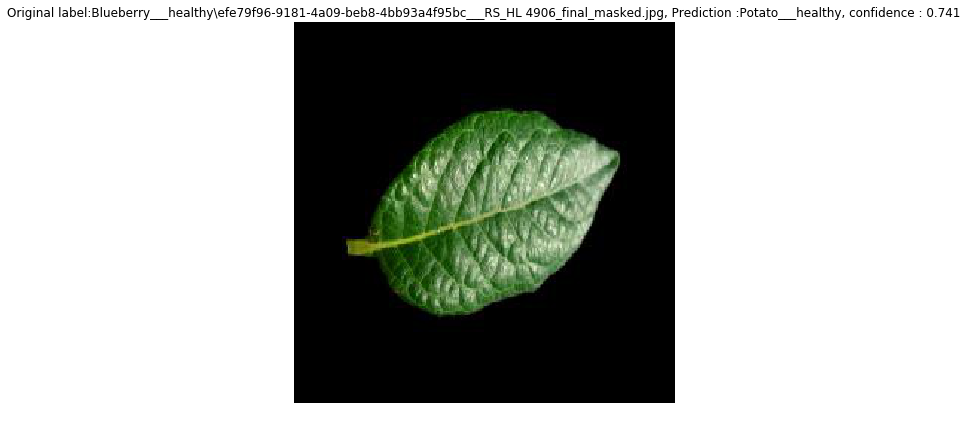

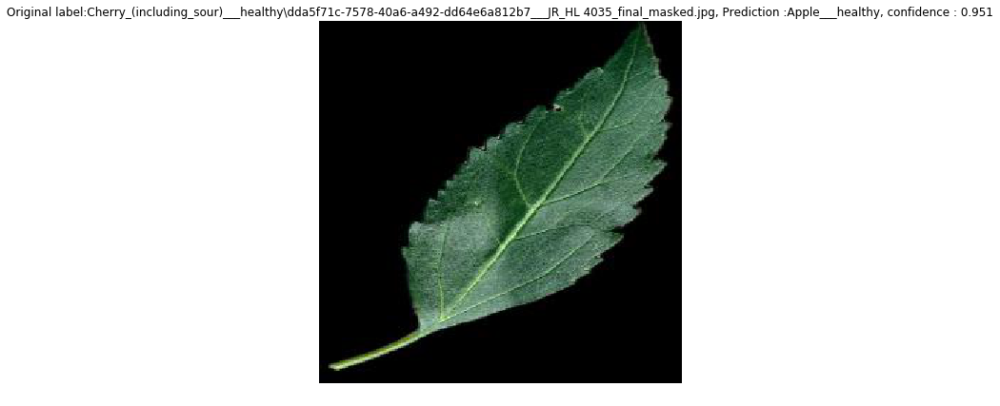

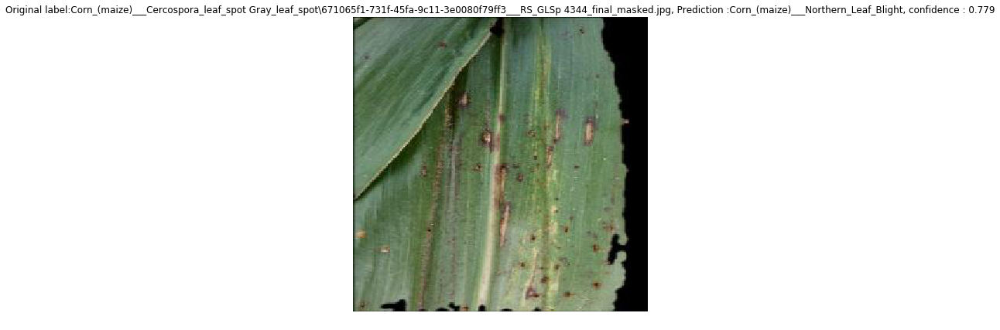

...

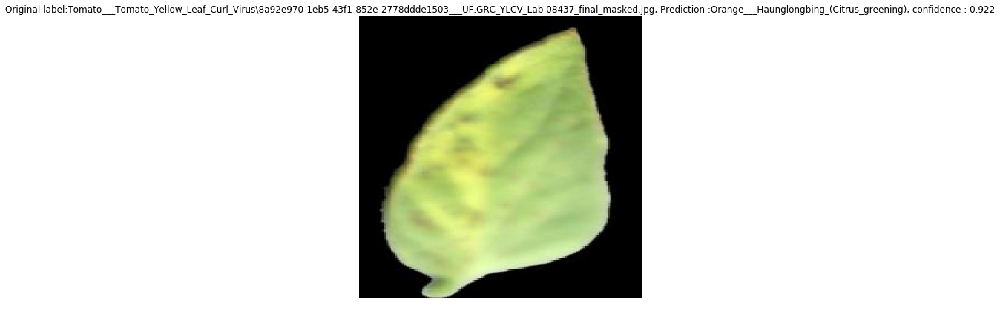

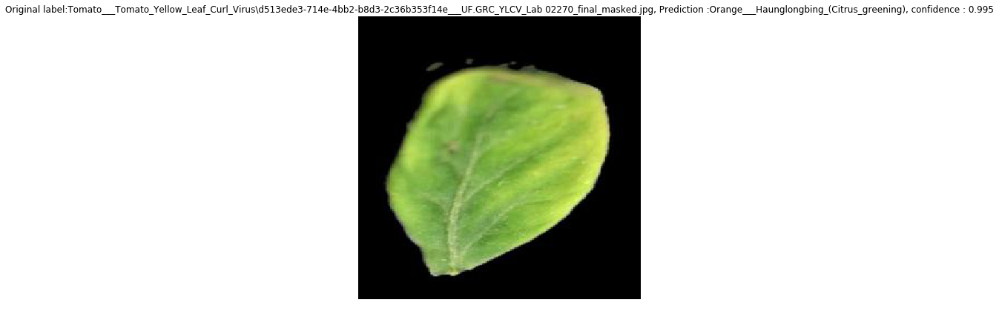

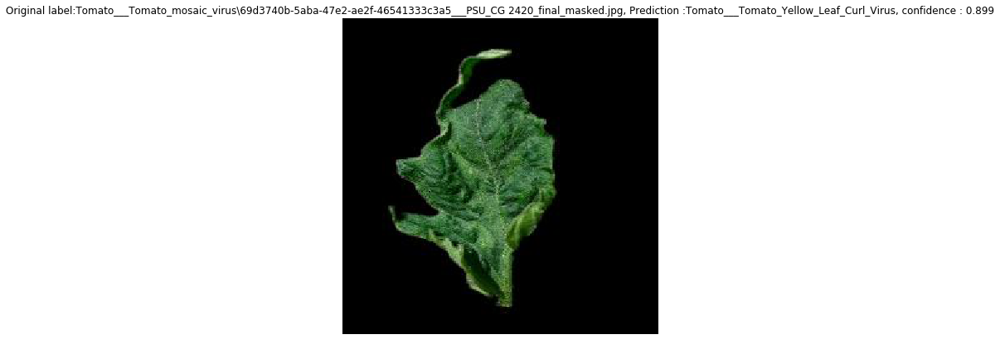

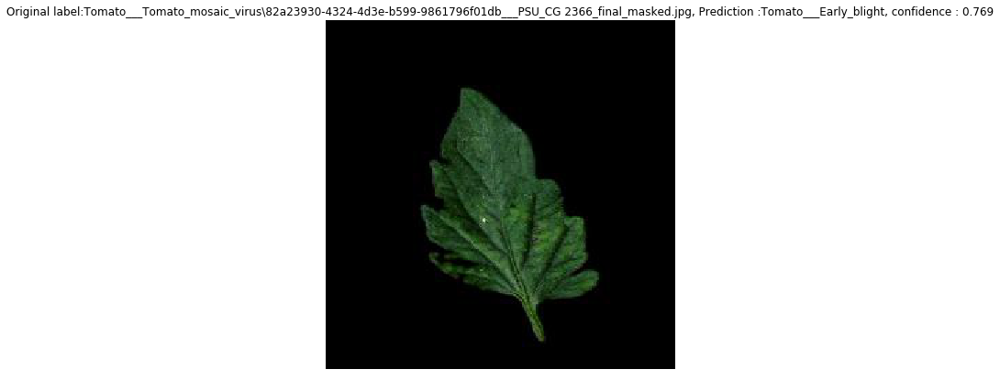

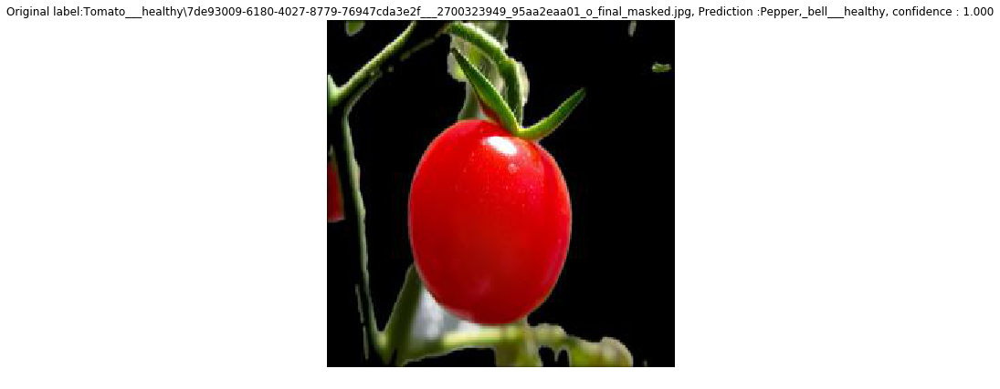

In [36]:
predicted_classes = np.argmax(predictions,axis=1)
errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_generator.samples))
 
# Show the errors
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
     
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
     
    original = image.load_img('{}/{}'.format("data/val",fnames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()

## Predict Output

In [7]:
# load json and create model

from keras.models import model_from_json
json_file = open('weights/VGG16/VGG16_model.json', 'r')
model_json = json_file.read()
json_file.close()
model = model_from_json(model_json)
# load weights into new model
model.load_weights("weights/vgg16_best.hdf5")
print("Loaded model from disk")

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Loaded model from disk


In [8]:
 model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 256, 256, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 64, 128)       0         
__________

In [14]:
import cv2
from tqdm import tqdm
import itertools
import numpy as np
import matplotlib.pyplot as plt
import json

In [71]:
im = cv2.imread("test images/grape_leafblight.jpg")

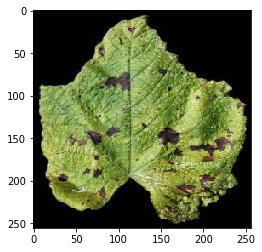

In [72]:
im = cv2.resize(cv2.cvtColor(im, cv2.COLOR_BGR2RGB), (256, 256))
plt.imshow(im)
im = np.expand_dims(im, axis =0)
im=cv2.normalize(im.astype('float'), None, 0.0, 1.0, cv2.NORM_MINMAX)

In [73]:
outcome=model.predict(im)

In [74]:
outcome

array([[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 4.7193631e-30,
        0.0000000e+00, 1.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        1.1096897e-37, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        1.3142201e-29, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 5.9002393e-32, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        8.5457470e-33, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00]], dtype=float32)

In [75]:
sorted(outcome[0],reverse=True)

[1.0,
 1.3142201e-29,
 4.719363e-30,
 5.9002393e-32,
 8.545747e-33,
 1.1096897e-37,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]

In [76]:
pred=sorted(((e,i) for i,e in enumerate(outcome[0])),reverse=True)[0:5]

In [77]:
pred

[(1.0, 13),
 (1.3142201e-29, 20),
 (4.719363e-30, 11),
 (5.9002393e-32, 26),
 (8.545747e-33, 32)]

In [78]:
sum(outcome[0])

1.0

In [79]:
np.argmax(outcome)

13

In [80]:
with open('labels.json', 'r') as fp:
    data = json.load(fp)

In [81]:
data

{'0': 'Apple___Apple_scab',
 '1': 'Apple___Black_rot',
 '2': 'Apple___Cedar_apple_rust',
 '3': 'Apple___healthy',
 '4': 'Blueberry___healthy',
 '5': 'Cherry_(including_sour)___Powdery_mildew',
 '6': 'Cherry_(including_sour)___healthy',
 '7': 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 '8': 'Corn_(maize)___Common_rust_',
 '9': 'Corn_(maize)___Northern_Leaf_Blight',
 '10': 'Corn_(maize)___healthy',
 '11': 'Grape___Black_rot',
 '12': 'Grape___Esca_(Black_Measles)',
 '13': 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 '14': 'Grape___healthy',
 '15': 'Orange___Haunglongbing_(Citrus_greening)',
 '16': 'Peach___Bacterial_spot',
 '17': 'Peach___healthy',
 '18': 'Pepper,_bell___Bacterial_spot',
 '19': 'Pepper,_bell___healthy',
 '20': 'Potato___Early_blight',
 '21': 'Potato___Late_blight',
 '22': 'Potato___healthy',
 '23': 'Raspberry___healthy',
 '24': 'Soybean___healthy',
 '25': 'Squash___Powdery_mildew',
 '26': 'Strawberry___Leaf_scorch',
 '27': 'Strawberry___healthy',
 '28': 'Toma

In [82]:
for x in pred:
    print(x)
    print("predited class:",data[str(x[1])],"  with confidence: ",x[0]*100,"%")

(1.0, 13)
predited class: Grape___Leaf_blight_(Isariopsis_Leaf_Spot)   with confidence:  100.0 %
(1.3142201e-29, 20)
predited class: Potato___Early_blight   with confidence:  1.3142201379594384e-27 %
(4.719363e-30, 11)
predited class: Grape___Black_rot   with confidence:  4.71936305877736e-28 %
(5.9002393e-32, 26)
predited class: Strawberry___Leaf_scorch   with confidence:  5.900239316445339e-30 %
(8.545747e-33, 32)
predited class: Tomato___Septoria_leaf_spot   with confidence:  8.545746952194087e-31 %


In [ ]:
from keras.models import model_from_json
import cv2
import numpy as np
import json

# loading model from json
json_file = open('weights/VGG16/VGG16_model.json', 'r')
model_json = json_file.read()
json_file.close()
model = model_from_json(model_json)
# load weights into new model
model.load_weights("weights/VGG16/vgg16_best.hdf5")
#print("Loaded model from disk")

# file path
im = cv2.imread("test images/tomato_healthy.JPG")
im = cv2.resize(cv2.cvtColor(im, cv2.COLOR_BGR2RGB), (256, 256))
im = np.expand_dims(im, axis =0)

outcome = model.predict(im)

# loading labels file to convert to string
with open('labels.json', 'r') as fp:
    data = json.load(fp)

pred_disease=data[str(np.argmax(outcome))]
print("predicted output:",pred_disease)